# Geospatial analysis

Installations, imports and setup

In [11]:
!pip install geopandas pandana folium matplotlib mapclassify osmnx fiona pyogrio --quiet

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import matplotlib.pyplot as plt
import seaborn as sns
import pandana
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import networkx as nx

In [3]:
# Clone git repository
! git clone https://github.com/Ggenoni/Geospatial_analysis_and_representation.git
# Change directory
%cd Geospatial_analysis_and_representation/data

Cloning into 'Geospatial_analysis_and_representation'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 53 (delta 12), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (53/53), 13.71 MiB | 7.55 MiB/s, done.
Resolving deltas: 100% (12/12), done.
/content/Geospatial_analysis_and_representation/data


In [14]:
#!wget https://github.com/Ggenoni/Geospatial_analysis_and_representation/blob/main/data/isoipsa.zip
!unzip isoipsa.zip

--2025-02-18 10:49:55--  https://github.com/Ggenoni/Geospatial_analysis_and_representation/blob/main/data/isoipsa.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘isoipsa.zip.1’

isoipsa.zip.1           [ <=>                ] 223.30K  --.-KB/s    in 0.1s    

2025-02-18 10:49:55 (1.83 MB/s) - ‘isoipsa.zip.1’ saved [228660]

Archive:  isoipsa.zip
  inflating: isoipsa.geojson         


### Circoscrizioni

In [ ]:
# Step 1: Load the GeoJSON file
circoscrizioni = gpd.read_file("circoscrizioni.geojson")

In [ ]:
# Step 2: Check the current coordinate reference system (CRS)
print("Current CRS:", circoscrizioni.crs)

Current CRS: EPSG:25832


In [ ]:
# Step 3: Reproject to WGS84
if circoscrizioni.crs != "EPSG:32632":
    circoscrizioni = circoscrizioni.to_crs("EPSG:32632")
    print("Reprojected to:", circoscrizioni.crs)

Reprojected to: EPSG:32632


In [ ]:
circoscrizioni

,numero_circ,area,perimetro,nome,fumetto,geometry
0,2,15712181,17850,MEANO,Circoscrizione n. 2 - MEANO,"POLYGON ((666651.786 5109264.903, 666650.353 5..."
1,3,36949609,38485,BONDONE,Circoscrizione n. 3 - BONDONE,"POLYGON ((660741.737 5109007.135, 660757.283 5..."
2,4,8663138,16403,SARDAGNA,Circoscrizione n. 4 - SARDAGNA,"POLYGON ((661627.54 5104968.137, 661632.747 51..."
3,6,13199398,20575,ARGENTARIO,Circoscrizione n. 6 - ARGENTARIO,"POLYGON ((667907.213 5105334.453, 667905.638 5..."
4,11,3073349,10962,S.GIUSEPPE-S.CHIARA,Circoscrizione n. 11 - S.GIUSEPPE-S.CHIARA,"POLYGON ((663312.544 5102745.129, 663330.224 5..."
5,7,15433274,18464,POVO,Circoscrizione n. 7 - POVO,"POLYGON ((669072.179 5099653.356, 668637.088 5..."
6,5,16687779,27197,RAVINA-ROMAGNANO,Circoscrizione n. 5 - RAVINA-ROMAGNANO,"POLYGON ((663871.728 5094972.066, 663852.148 5..."
7,8,16409555,24413,MATTARELLO,Circoscrizione n. 8 - MATTARELLO,"POLYGON ((663871.728 5094972.066, 663875.878 5..."
8,9,7342864,15395,VILLAZZANO,Circoscrizione n. 9 - VILLAZZANO,"POLYGON ((666987.471 5098181.576, 666974.784 5..."
9,10,6962104,15418,OLTREFERSINA,Circoscrizione n. 10 - OLTREFERSINA,"POLYGON ((663813.095 5101039.248, 663813.095 5..."


Circoscrizione n. 10 - OLTREFERSINA


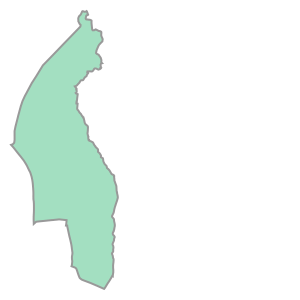

In [ ]:
print(circoscrizioni.fumetto[9])
circoscrizioni.geometry[9]

In [ ]:
circoscrizioni.explore(
    column="nome",
    tooltip="fumetto",
    cmap="tab20",
    legend=True,
    style_kwds={"color": "black", "weight": 1.5, "fillOpacity": 0.75}
)


In [26]:
circoscrizioni["city"] = "Trento"
trento = circoscrizioni[["city", "geometry"]]
trento = trento.dissolve(by= "city")
trento

,geometry
city,
Trento,"POLYGON ((663839.988 5094989.926, 663838.711 5..."


In [27]:
trento.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

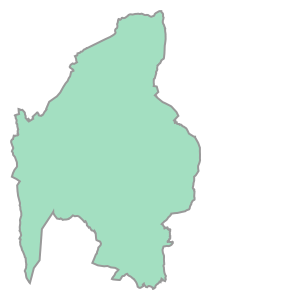

In [ ]:
trento.geometry.values[0]

In [ ]:
trento.explore(tiles="OpenTopoMap")

### Elevation contours

In [17]:
# Load isoipse data
isoipsa = gpd.read_file("isoipsa.geojson", engine="fiona").to_crs(epsg=32632)

In [16]:
isoipsa.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
isoipsa

,length,tipo,dxf_elevat,descrizion,simbolo,fumetto,geometry
0,21.36660,1.08.01,1380.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (660600.549 5101460.185, 660614.519..."
1,2.07404,1.08.01,1520.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (656786.444 5100883.196, 656786.534..."
2,15.40140,1.09.01,950.0,Linee invisibili per la continuit… di curve di...,0,Curva di livello direttrice,"LINESTRING (661522.018 5100883.548, 661527.508..."
3,10.08750,1.08.01,920.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (661800.572 5100822.987, 661796.412..."
4,10.43210,1.08.01,1290.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (657173.213 5100480.19, 657171.813 ..."
...,...,...,...,...,...,...,...
68673,28.81340,1.09.01,210.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (663687.999 5100358.591, 663688.585..."
68674,13.04440,1.09.01,200.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (665030.982 5101871.338, 665030.853..."
68675,1.58984,1.09.01,190.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (664476.972 5101634.255, 664476.971..."
68676,13.74200,1.09.01,190.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (664616.936 5100142.856, 664616.002..."


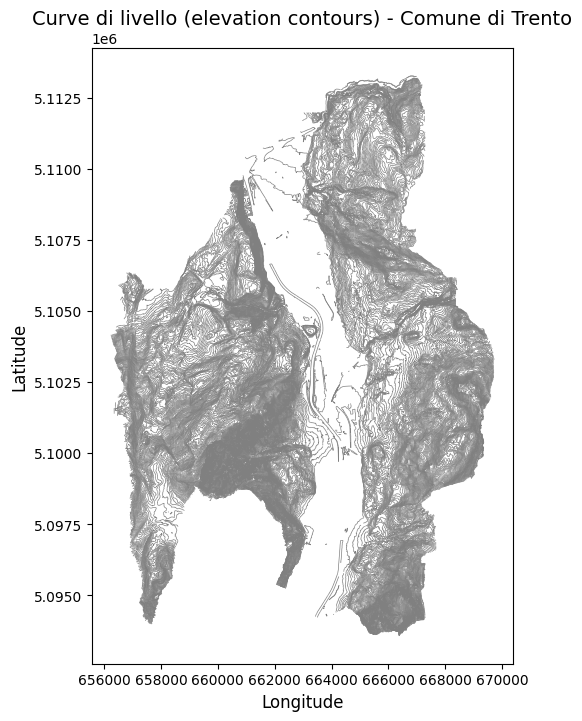

In [18]:
plt.rcdefaults()
# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot isoipse
isoipsa.plot(ax=ax, color="gray", linewidth=0.5)

# Set title and labels
ax.set_title("Curve di livello (elevation contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Force Matplotlib to show ticks
#ax.tick_params(axis="both", which="both", direction="in", length=5)

plt.show()

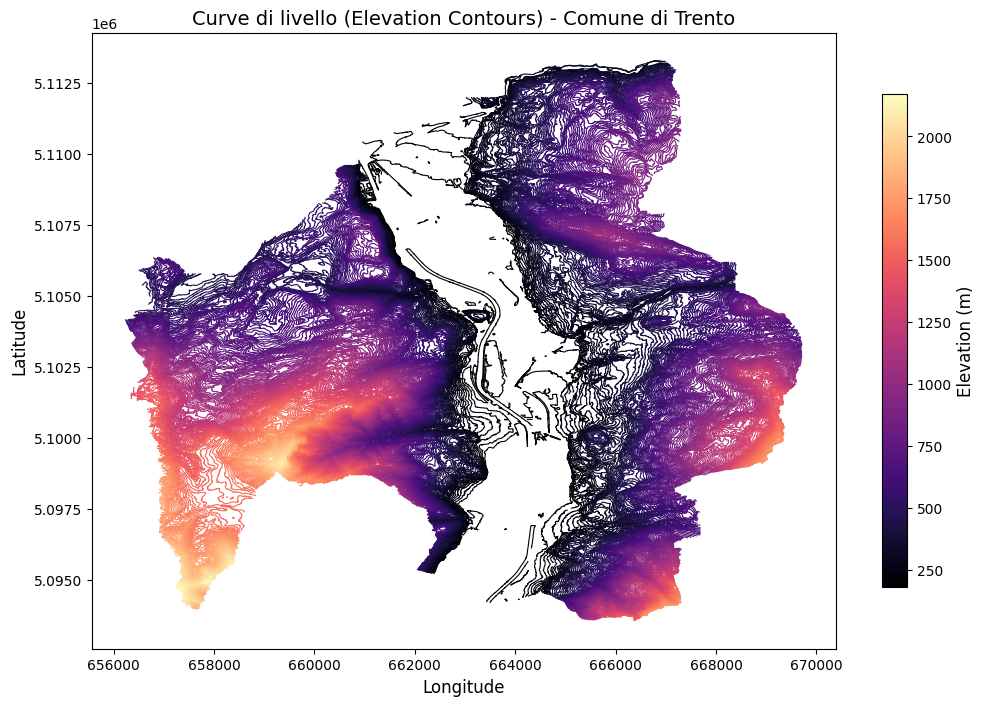

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.cm as cm

plt.rcdefaults()

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Normalize elevation values for colormap
norm = mcolors.Normalize(vmin=isoipsa["dxf_elevat"].min(), vmax=isoipsa["dxf_elevat"].max())
cmap = cm.magma  # Use the magma colormap

# Plot each contour line with a color based on its elevation
for _, row in isoipsa.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.dxf_elevat)), linewidth=0.8)

# Add colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=12)

# Set title and labels
ax.set_title("Curve di livello (Elevation Contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

plt.show()


In [ ]:
circoscrizioni= circoscrizioni.to_crs("EPSG:32632")

In [ ]:
circoscrizioni.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
isoipsa.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

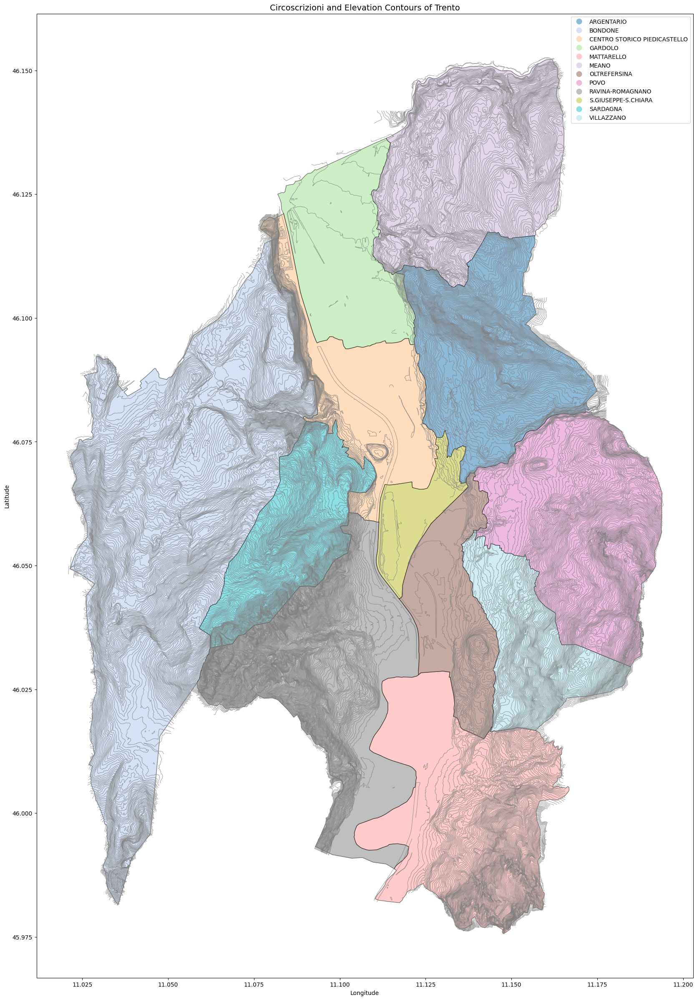

In [ ]:
# Create plot
fig, ax = plt.subplots(figsize=(30, 30))

# Use a larger categorical colormap
circoscrizioni.plot(ax=ax, column="nome", cmap="tab20", edgecolor="black", alpha=0.5, legend=True)

# Overlay the elevation contours (isoipse)
isoipsa.plot(ax=ax, color="gray", linewidth=0.8, alpha=0.7)

# Add labels and title
plt.title("Circoscrizioni and Elevation Contours of Trento", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()


### Walkability

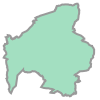

In [ ]:
#Use this if needed

# Reproject to WGS 84 (EPSG:4326) if needed
if circoscrizioni.crs != "EPSG:4326":
    circoscrizioni = circoscrizioni.to_crs("EPSG:4326")

# Merge all geometries into a single polygon if necessary
polygon = circoscrizioni.union_all()
polygon

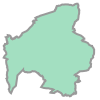

In [28]:
# Ensure the city boundary (trento) is in WGS 84 (EPSG:4326) - global coordinate reference system that uses latitude & longitude - before using it with OSM
if trento.crs != "EPSG:4326":
    trento = trento.to_crs("EPSG:4326")
polygon = trento.geometry.iloc[0]
polygon

In [ ]:
# Get the walking network within the city boundary
walkways = ox.graph_from_polygon(polygon, network_type="walk")

# Reproject the graph to EPSG:32632 for accurate spatial analysis
# EPSG:32632 is a UTM projection for Northern Italy, which uses meters instead of degrees.
#It's better for distance calculations, slope analysis, and spatial accuracy in local studies.
crs = "EPSG:32632"
walkways = ox.projection.project_graph(walkways, to_crs=crs)

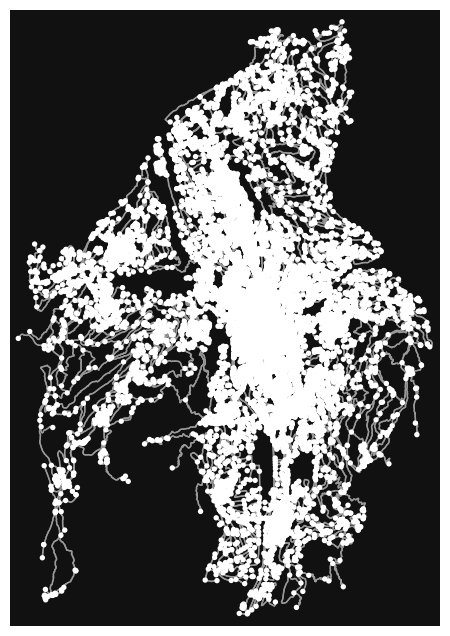

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
ox.plot_graph(walkways)

In [ ]:
walk_nodes, walk_edges = ox.graph_to_gdfs(walkways)

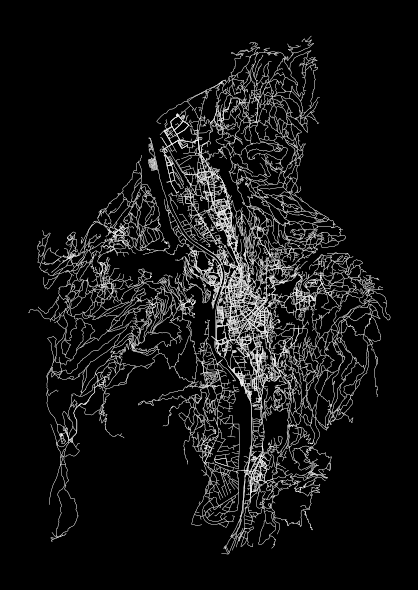

In [ ]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot data
walk_edges.plot(
    ax=ax,
    color='white',
    linewidth=0.2
)

# Tight layout
plt.tight_layout()

In [ ]:
isoipsa= isoipsa.to_crs("EPSG:32632")
isoipsa.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# ALTITUDE

# Extract elevation points
isoipsa['elevation'] = isoipsa['dxf_elevat'].astype(float)  # Convert to numeric
elevation_points = np.array([isoipsa.geometry.centroid.x, isoipsa.geometry.centroid.y, isoipsa['elevation']]).T

# Build KDTree for fast nearest neighbor search
tree = cKDTree(elevation_points[:, :2])

In [ ]:
# Function to get elevation based on nearest contour line
def get_elevation(x, y):
    dist, idx = tree.query([x, y])
    return elevation_points[idx, 2]  # Return corresponding elevation

In [ ]:
# Compute elevation at the midpoint of each edge
walk_edges['mid_x'] = walk_edges.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).x)
walk_edges['mid_y'] = walk_edges.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).y)
walk_edges['elevation'] = walk_edges.apply(lambda row: get_elevation(row.mid_x, row.mid_y), axis=1)

print("Minimum elevation", walk_edges['elevation'].min())
print("Maximum elevation", walk_edges['elevation'].max())

Minimum elevation 178.83
Maximum elevation 2170.0


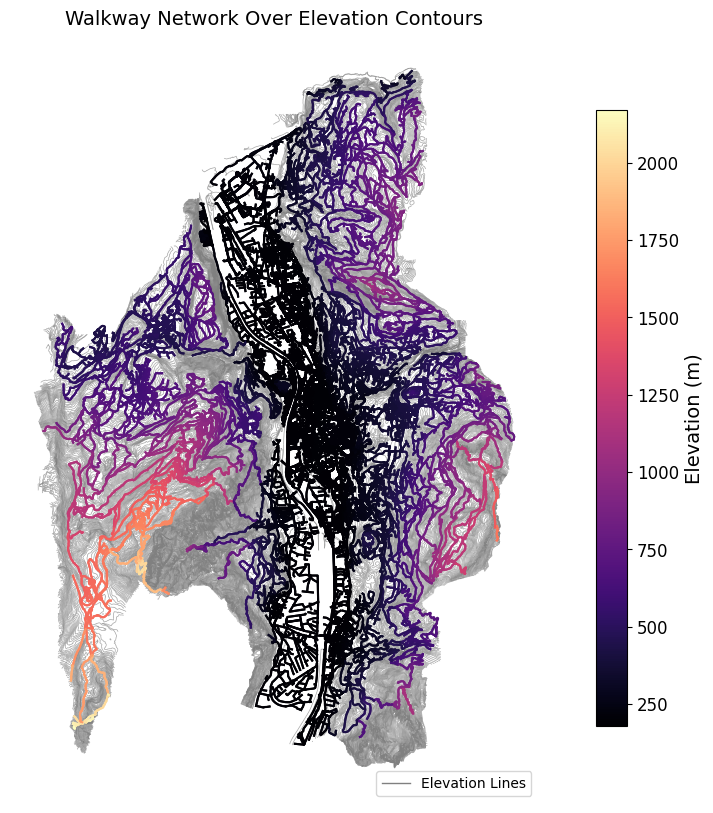

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_axis_off()
ax.set_aspect("equal")

# Plot isoipse (contour lines)
isoipsa.plot(ax=ax, color="gray", linewidth=0.5, alpha=0.7, label="Elevation Lines")

# Choose a better colormap
cmap = plt.cm.magma
norm = mcolors.Normalize(vmin=walk_edges['elevation'].min(), vmax=walk_edges['elevation'].max())

# Plot each sidewalk edge with color based on altitude
for _, row in walk_edges.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.elevation)), linewidth=1.5)

# Add colorbar with explicit tick labels in meters
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=14)
cbar.ax.tick_params(labelsize=12)

# Fix legend: manually add entries
legend_elements = [
    Line2D([0], [0], color="gray", lw=1, label="Elevation Lines"),
]
ax.legend(handles=legend_elements, loc="lower right")

plt.title("Walkway Network Over Elevation Contours", fontsize=14)
plt.show()


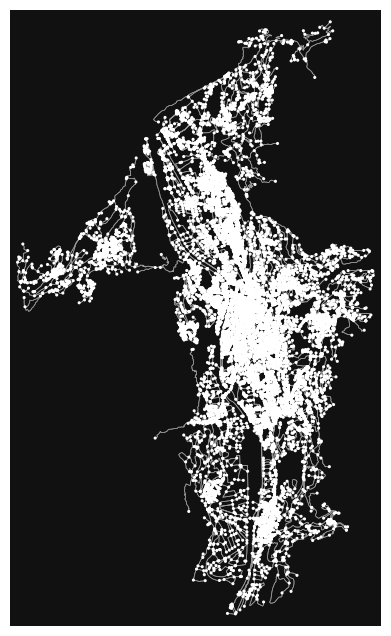

In [ ]:
#Altitudine Sardagna: 565 m

filtered_edges = walk_edges[walk_edges['elevation'] < 600].copy()
filtered_edges = filtered_edges.reset_index()  # Ensure 'u' and 'v' are columns
filtered_nodes = set(filtered_edges["u"]) | set(filtered_edges["v"])
filtered_walk_nodes = walk_nodes[walk_nodes.index.isin(filtered_nodes)]


# Create a new graph
graph = nx.MultiDiGraph()

# Add nodes back with their attributes
for node_id, node_data in filtered_walk_nodes.iterrows():
    graph.add_node(node_id, **node_data.to_dict())

# Add edges with their full attributes
for _, edge_data in filtered_edges.iterrows():
    graph.add_edge(edge_data["u"], edge_data["v"], **edge_data.drop(["u", "v"]).to_dict())

# Preserve the original CRS
graph.graph["crs"] = walkways.graph["crs"]
nodes, edges = ox.graph_to_gdfs(graph)
fig, ax = ox.plot_graph(graph, node_size=5, edge_linewidth=0.5, show=True)



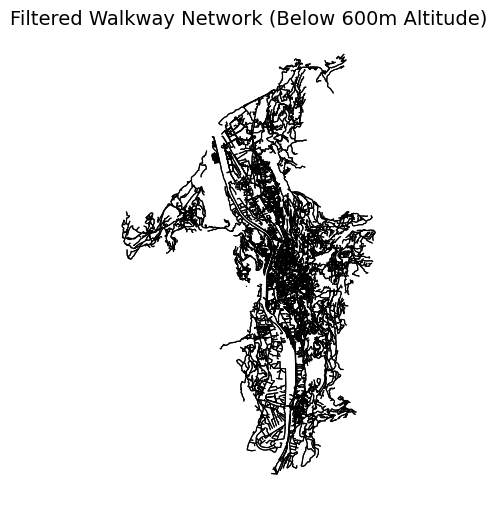

In [ ]:
import matplotlib.pyplot as plt

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot edges
edges.plot(ax=ax, color="black", linewidth=0.8)

# Set title
ax.set_title("Filtered Walkway Network (Below 600m Altitude)", fontsize=14)

# Remove axis ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

plt.show()


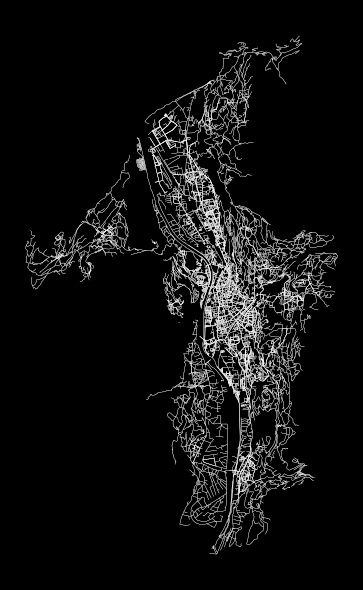

In [ ]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot data
edges.plot(
    ax=ax,
    color='white',
    linewidth=0.2
)

# Tight layout
plt.tight_layout()

NameError: name 'ox' is not defined

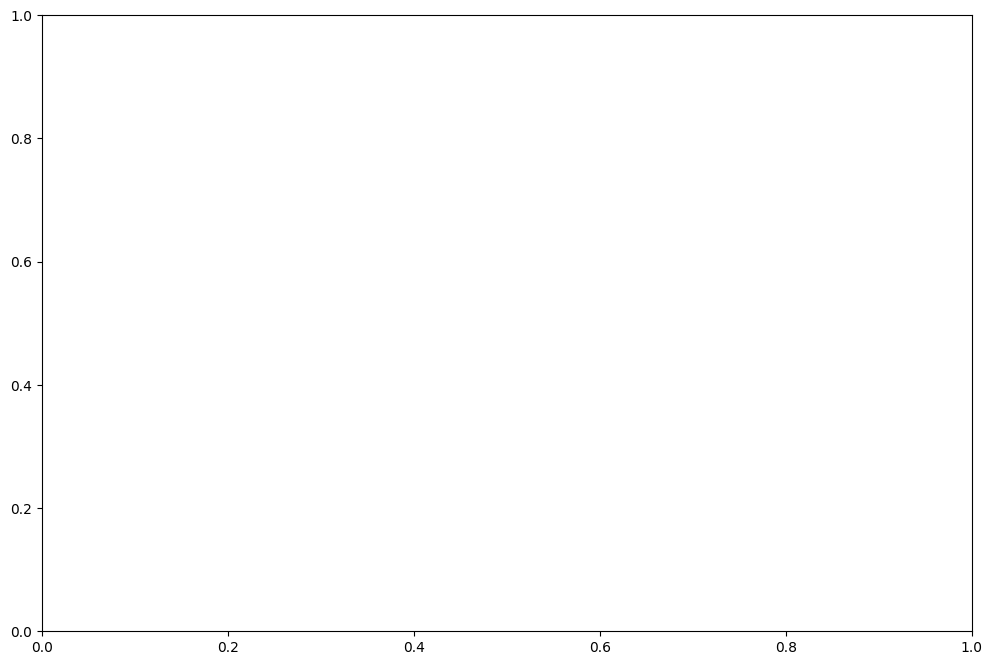

In [ ]:
import matplotlib.pyplot as plt

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# 🎨 Plot the filtered graph
ox.plot_graph(graph, ax=ax, node_size=5, edge_linewidth=0.5, show=False)

# 🎭 Overlay the circoscrizioni (districts)
circoscrizioni.boundary.plot(ax=ax, color="black", linewidth=1)  # Add black borders
circoscrizioni.plot(ax=ax, alpha=0.3, cmap="tab10")  # Fill with colors (adjust alpha for transparency)

# 🏷️ Add district labels
for idx, row in circoscrizioni.iterrows():
    centroid = row.geometry.centroid
    ax.text(centroid.x, centroid.y, row["nome"], fontsize=10, ha="center", color="black", weight="bold")

# 🎯 Final touches
ax.set_title("Filtered Walkability Graph with Circoscrizioni Overlay", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.show()


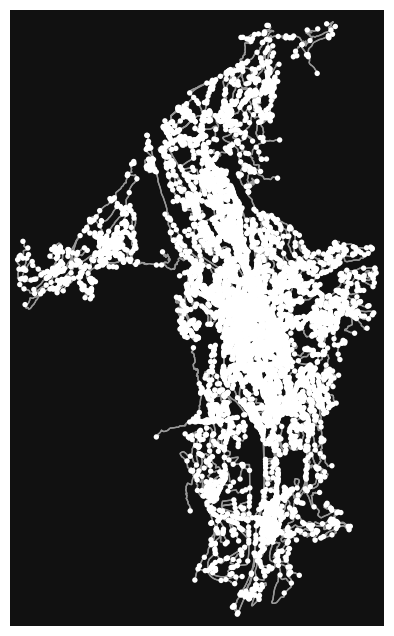

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
graph_simplified = ox.simplification.consolidate_intersections(
    # Graph to simplify
    graph,
    # buffer around each node (project the graph beforehand)
    tolerance=5,
    # Get result as graph (False to get nodes only as gdf)
    rebuild_graph=True,
    # no dead ends
    dead_ends=False,
    # Reconnect (False to get intersections only)
    reconnect_edges=True
)
crs = "EPSG:32632"
graph_simplified = ox.projection.project_graph(graph_simplified, to_crs=crs)
nodes_s, edges_s = ox.graph_to_gdfs(graph_simplified)
ox.plot_graph(graph_simplified)

In [ ]:
print(edges.crs)


EPSG:32632


In [ ]:
xmin, ymin, xmax, ymax = edges.total_bounds
print(f"Bounding box of edges: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")
# Simplified
xmin_s, ymin_s, xmax_s, ymax_s = edges_s.total_bounds
print(f"Bounding box of edges_s: xmin={xmin_s}, xmax={xmax_s}, ymin={ymin_s}, ymax={ymax_s}")


Bounding box of edges: xmin=656844.12340662, xmax=668266.3254038118, ymin=5094236.523220613, ymax=5113189.632449756
Bounding box of edges_s: xmin=656844.12340662, xmax=668266.3254038118, ymin=5094244.970973965, ymax=5113047.544250995


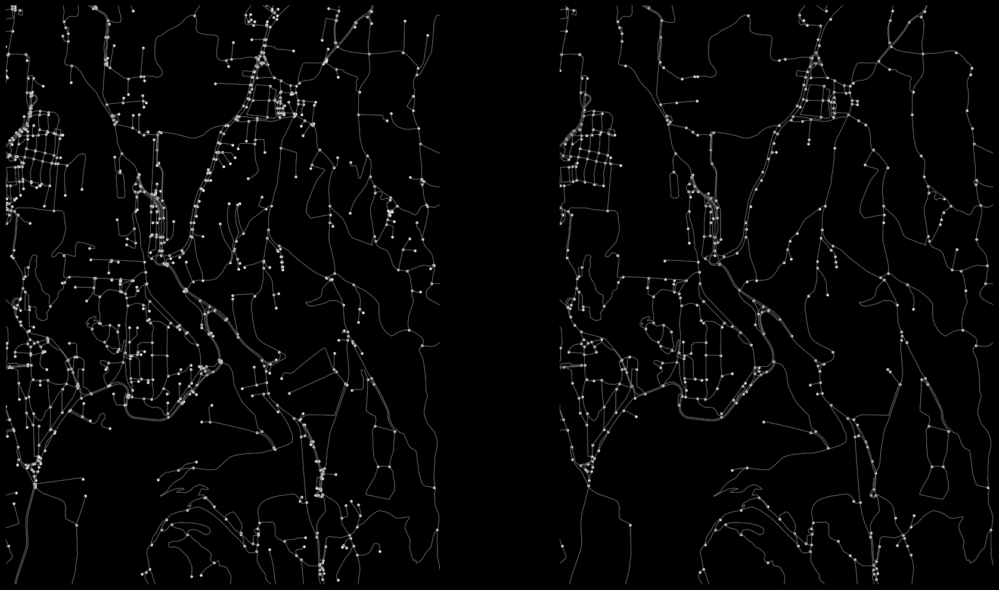

In [ ]:
# Define colors
edgecol = [0.5,0.5,0.5]
nodecol = 'white'
linewidth = 0.5
markersize = 5

# Setup plot
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
fig.set_facecolor('black')

# Plot original graph
edges.plot(ax=ax[0], color=edgecol, linewidth=linewidth)
nodes.plot(ax=ax[0], color=nodecol, markersize=markersize)

# Plot simplified graph
edges_s.plot(ax=ax[1], color=edgecol, linewidth=linewidth)
nodes_s.plot(ax=ax[1], color=nodecol, markersize=markersize)

# Zoom in
plt.setp(ax[0], xlim=(665000, 666500), ylim=(5100000, 5102000))
plt.setp(ax[1], xlim=(665000, 666500), ylim=(5100000, 5102000))

# Tight layout
plt.tight_layout()

In [ ]:
# Print info
print(
    'number of nodes:\n\noriginal graph: '+str(len(nodes))
    +'\nsimplified graph: '+str(len(nodes_s))
)

number of nodes:

original graph: 18202
simplified graph: 8499


Using vmax: 16.998


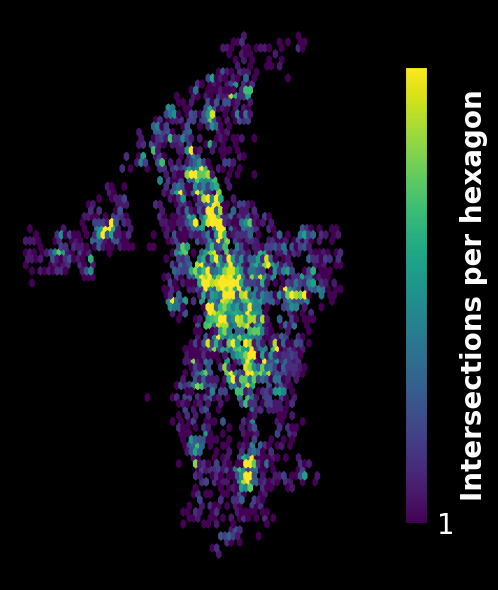

In [ ]:
# Set all text color to white
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

vmax_value = nodes_s.shape[0] / 500  # Adjust divisor to control max density range
hb = ax.hexbin(
    x=nodes_s['x'],
    y=nodes_s['y'],
    gridsize=75,
    cmap='viridis',
    mincnt=1,
    vmax=vmax_value,  # Dynamically adjust max value
)
print(f"Using vmax: {vmax_value}")


# Colorbar
cb = plt.colorbar(hb, ax=ax, shrink=0.8, ticks=[1, 20, 40, 60, 80, 100])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['1', '20', '40', '60', '80', '>= 100'])
cb.set_label('Intersections per hexagon', fontsize=20, fontweight='bold')

# Tight layout
plt.tight_layout()

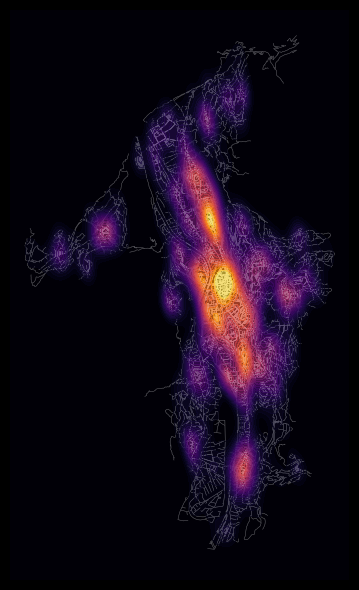

In [ ]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot streets underneath
edges.plot(ax=ax, color=[1,1,1], linewidth=0.3, zorder=0)

# Plot KDE on top
sns.kdeplot(
    ax=ax,
    data=nodes_s,
    x='x', y='y',
    hue=None,
    fill=True,
    cmap='inferno',  # Stronger contrast
    thresh=0,
    levels=30,  # More contour levels
    alpha=0.7,  # Slightly less transparency
    zorder=10,
    bw_adjust=0.5  # More detailed density
)

# Tight layout
plt.tight_layout()


In [ ]:
# Select points of interest based on osm tags
tags = {
    'amenity':[
        'cafe',
        'bar',
        'pub',
        'restaurant'
    ],
    'shop':[
        'bakery',
        'convenience',
        'supermarket',
        'mall',
        'department_store',
        'clothes',
        'fashion',
        'shoes'
    ],
    'leisure':[
        'fitness_centre'
    ]
}

# Get amentities from place
#pois = ox.geometries.geometries_from_place(polygon, tags=tags)



# Get POIs from OSM
pois = ox.features_from_polygon(polygon, tags)
# Project pois
pois = pois.to_crs(epsg=32632)

                                         geometry addr:housenumber  \
element id                                                           
node    247887464  POINT (665525.458 5104255.221)               13   
        248051531  POINT (665465.587 5104127.425)               27   
        259973562  POINT (665396.468 5108452.823)                2   
        268401562  POINT (664033.084 5103759.573)               40   
        268401567  POINT (664114.589 5103764.327)                1   

                  addr:postcode             addr:street     amenity  \
element id                                                            
node    247887464   38121-38123  Via degli Alberti Poja  restaurant   
        248051531           NaN         Via per Cognola         NaN   
        259973562           NaN         Via del Lavaron  restaurant   
        268401562         38122        Piazza del Duomo        cafe   
        268401567         38122       Piazza Mario Pasi        cafe   

           

<Axes: >

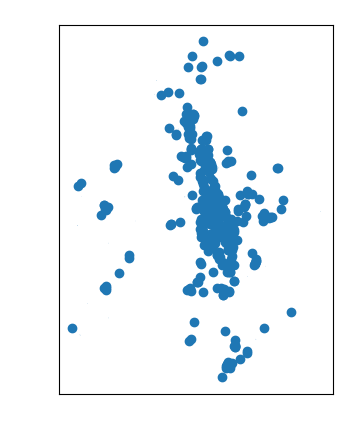

In [ ]:

# Display first few POIs
print(pois.head())

# Plot POIs
pois.plot()

In [ ]:
# Max time to walk in minutes (no routing to nodes further than this)
walk_time = 15

# Walking speed
walk_speed = 4.5

# Set a uniform walking speed on every edge
for u, v, data in graph.edges(data=True):
    data['speed_kph'] = walk_speed
graph = ox.add_edge_travel_times(graph)

# Extract node/edge GeoDataFrames, retaining only necessary columns (for pandana)
nodes = ox.graph_to_gdfs(graph, edges=False)[['x', 'y']]
edges = ox.graph_to_gdfs(graph, nodes=False).reset_index()[['u', 'v', 'travel_time']]

In [ ]:
# Construct the pandana network model
network = pandana.Network(
    node_x=nodes['x'],
    node_y=nodes['y'],
    edge_from=edges['u'],
    edge_to=edges['v'],
    edge_weights=edges[['travel_time']]
)

# Extract centroids from the pois' geometries
centroids = pois.centroid

In [ ]:
# Specify a max travel distance for analysis
# Minutes -> seconds
maxdist = walk_time * 60

# Set the pois' locations on the network
network.set_pois(
    category='pois',
    maxdist=maxdist,
    maxitems=10,
    x_col=centroids.x,
    y_col=centroids.y
)

In [ ]:
# calculate travel time to 10 nearest pois from each node in network
distances = network.nearest_pois(
    distance=maxdist,
    category='pois',
    num_pois=10
)

distances.astype(int).head()

,1,2,3,4,5,6,7,8,9,10
osmid,,,,,,,,,,
9191982,332,481,494,524,545,569,681,724,724,734
9013746935,336,486,498,528,550,574,686,728,728,739
2454602411,378,448,478,527,591,615,727,770,770,780
9013746938,307,457,518,521,544,548,656,699,699,710
9192420,783,872,885,900,900,900,900,900,900,900


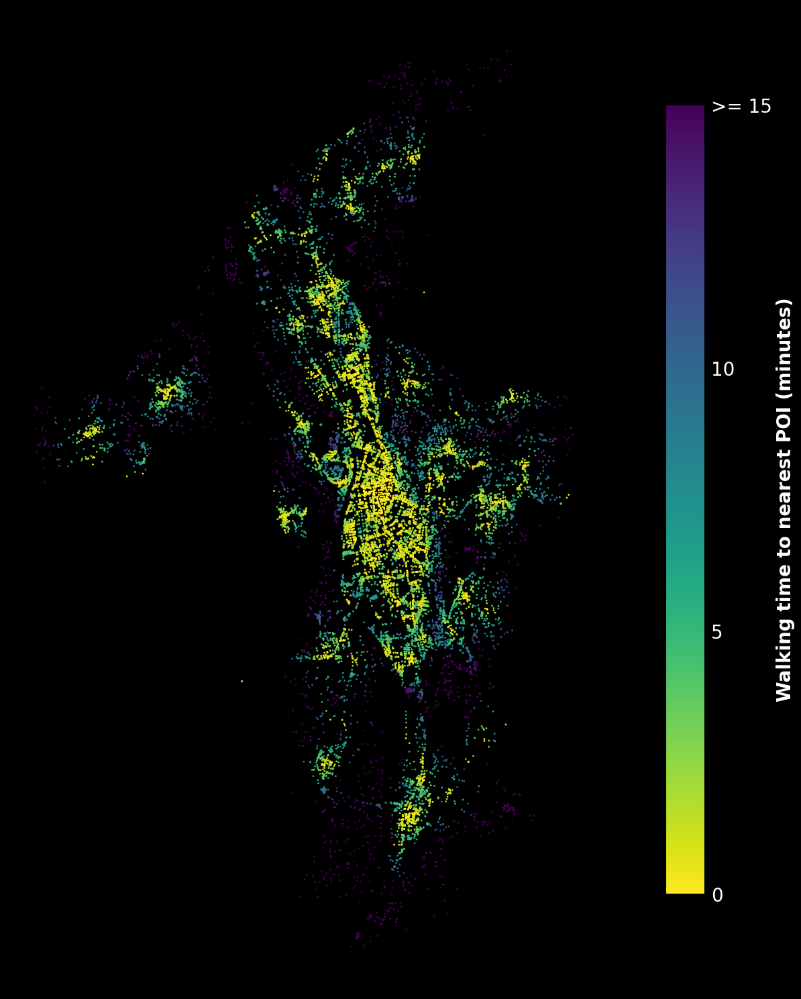

In [ ]:
# Set text parameters
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(20,15))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor((0,0,0))

# Plot distance to nearest POI
sc = ax.scatter(
    x=nodes['x'],
    y=nodes['y'],
    c=distances[1],
    s=1,
    cmap='viridis_r',
)

# Colorbar
cb = fig.colorbar(sc, ax=ax, shrink=0.8, ticks=[0, 300, 600, 900])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['0', '5', '10', '>= 15'])
cb.set_label('Walking time to nearest POI (minutes)', fontsize=20, fontweight='bold')

# Remove empty space
plt.tight_layout()

<ipython-input-256-6b9317228b87>:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


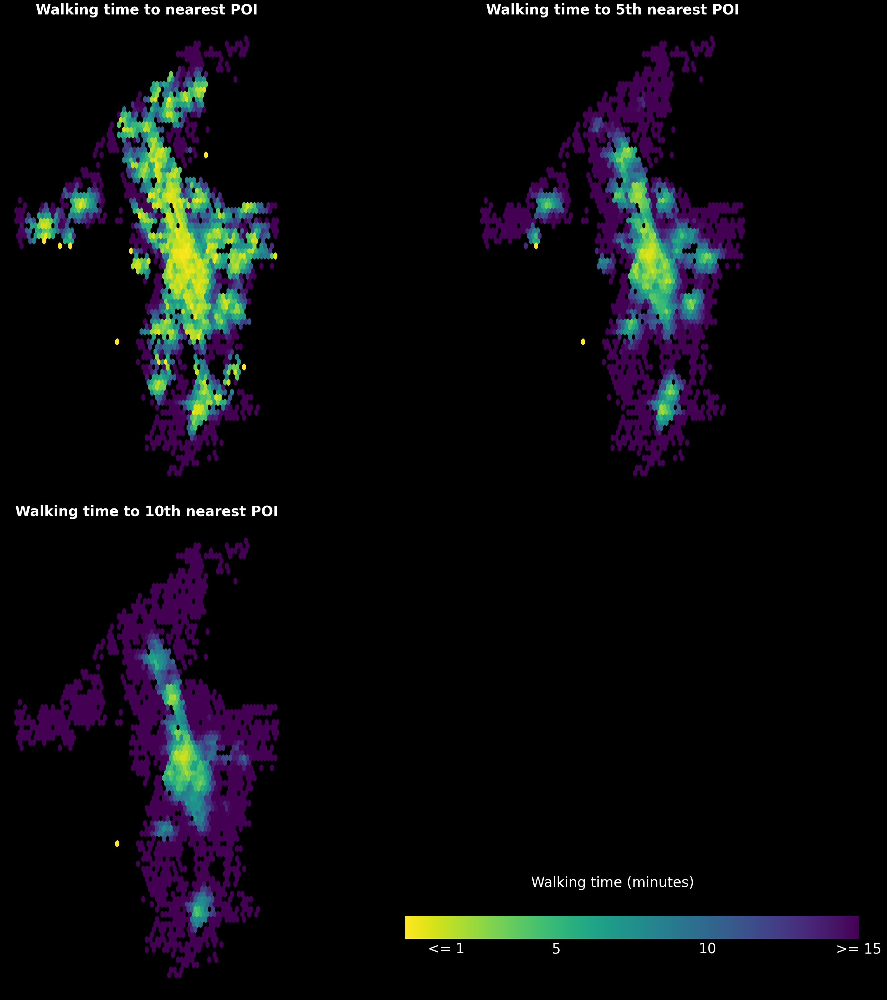

In [ ]:
# Setup plot
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(30,30), constrained_layout=False)
ax[0][0].set_axis_off()
ax[0][1].set_axis_off()
ax[1][0].set_axis_off()
ax[1][1].set_axis_off()
ax[0][0].set_aspect('equal')
ax[0][1].set_aspect('equal')
ax[1][0].set_aspect('equal')

# Specify colors
fig.set_facecolor('black')
cmap = 'viridis_r'

# Plot distance to nearest POI
hb = ax[0][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[1],
    alpha=1
)

# Plot distance to 5th nearest POI
hb = ax[0][1].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[5],
    alpha=1
)

# Plot distance to 10th nearest POI
hb = ax[1][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[10],
    alpha=1
)

# Add titles to maps
ax[0][0].set_title('Walking time to nearest POI', fontsize=30, fontweight='bold')
ax[0][1].set_title('Walking time to 5th nearest POI', fontsize=30, fontweight='bold')
ax[1][0].set_title('Walking time to 10th nearest POI', fontsize=30, fontweight='bold')

# Setup color bar axis (location of color bar)
cbar_ax = fig.add_axes([0.5, 0.01, 0.5, 0.5])
cbar_ax.set_axis_off()

# Color bar properties
cb = plt.colorbar(
    hb,
    ax=cbar_ax,
    shrink=0.9,
    ticks=[82, 300, 600, 900],
    orientation='horizontal',
    aspect=20
)

cb.outline.set_edgecolor('none')
cb.ax.tick_params(color='none', labelsize=30)
cb.ax.set_xticklabels(['<= 1', '5', '10', '>= 15'])

# Title for color bar
ax[1][1].text(0.5, 0.23, 'Walking time (minutes)', fontsize=30, ha='center')

# Tight layout
plt.tight_layout()

In [ ]:
sidewalk_tags = {
    "highway": [
        "footway",       # Dedicated pedestrian paths
        "path",          # General paths, may allow bikes/horses
        "pedestrian",    # Pedestrian-only streets
        "sidewalk",      # Explicitly mapped sidewalks
        "track",         # Sometimes used for pedestrian access
        "living_street"  # Streets where pedestrians have priority
    ],
    "footway": [
        "sidewalk",      # Sidewalks explicitly mapped
        "crossing"       # Pedestrian crossings
    ],
    "surface": [
        "paved", "asphalt", "concrete", "compacted", "paving_stones", "gravel"
    ],
    "lit": True,         # Check if the path has lighting (for safety)
    "width": True,       # Get width data if available
    "incline": True,     # Important for slope analysis
    "smoothness": True,  # Helps assess walkability for people with disabilities
}


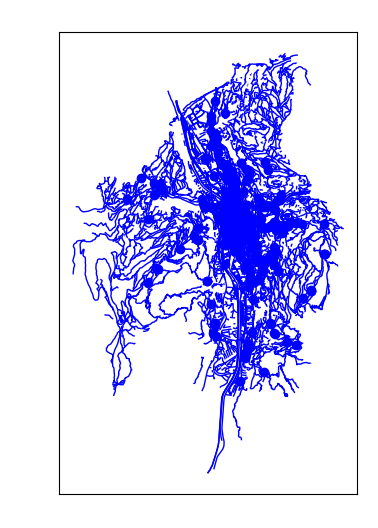

In [ ]:
# Define specific sidewalk-related OSM tags
#sidewalk_tags = {"highway": ["footway", "path", "pedestrian", "sidewalk"]}

# Get sidewalk geometries from OSM
sidewalks = ox.features_from_polygon(polygon, sidewalk_tags)

# Reproject to match your analysis CRS
sidewalks = sidewalks.to_crs(epsg=32632)

# Plot to check
fig, ax = plt.subplots(figsize=(10, 6))
sidewalks.plot(ax=ax, color="blue", linewidth=1)
plt.title("Extracted Sidewalk Network")
plt.show()


### Bikeability

<Figure size 1200x800 with 0 Axes>

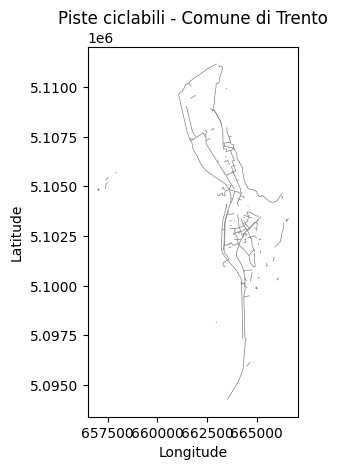

In [ ]:
plt.rcdefaults()

gdf_bike = gpd.read_file("piste_ciclabili.geojson")
gdf_bike = gdf_bike.to_crs("EPSG:32632")
# Plot piste ciclabili
plt.figure(figsize=(12, 8))
gdf_bike.plot(color="gray", linewidth=0.5)
plt.title("Piste ciclabili - Comune di Trento")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

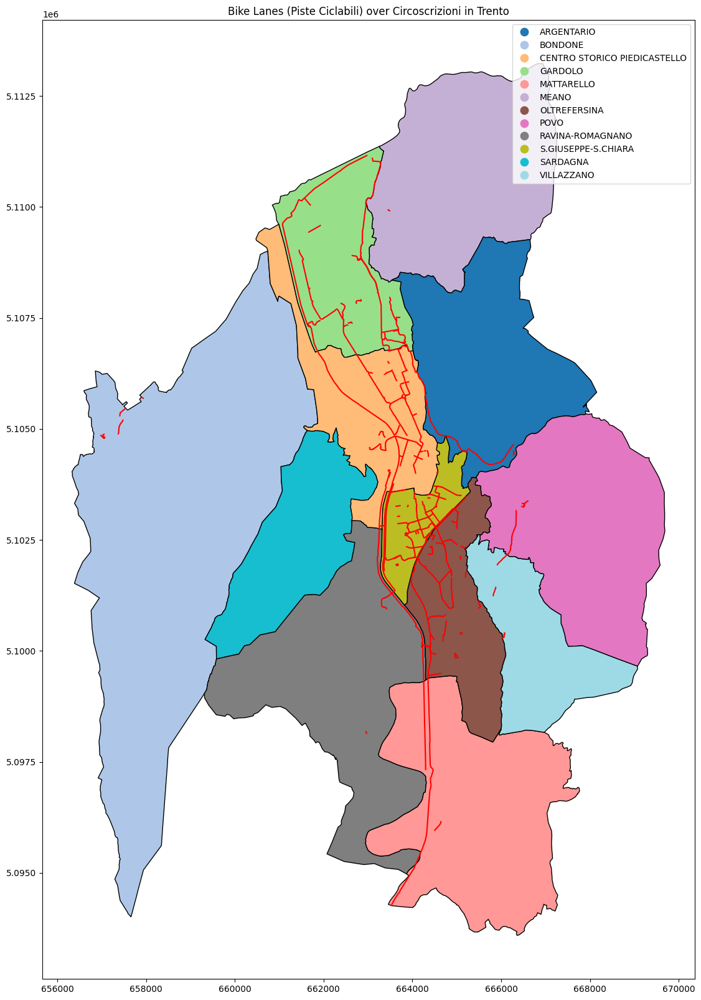

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(20,20))

# Plot circoscrizioni using "nome" to determine color with the tab20 colormap
circoscrizioni.plot(column="nome", ax=ax, cmap="tab20", edgecolor="black", legend = True)

# Overlay the bike lanes in red
gdf_bike.plot(ax=ax, color="red", linewidth=1.5)

ax.set_title("Bike Lanes (Piste Ciclabili) over Circoscrizioni in Trento")
plt.show()


<Figure size 1200x800 with 0 Axes>

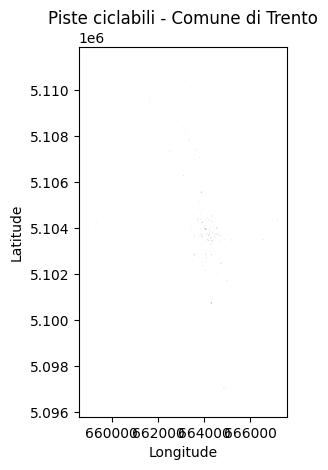

In [ ]:
plt.rcdefaults()

gdf = gpd.read_file("rastrelliere.geojson")
gdf = gdf.to_crs("EPSG:32632")
# Plot piste ciclabili
plt.figure(figsize=(12, 8))
gdf.plot(color="gray", linewidth=0.5)
plt.title("Piste ciclabili - Comune di Trento")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
gdf

,id,zona,tipologia,n_posti,fumetto,anno,nr_moduli,tot_bici,foto,codice_via,civico,barra,edificio,Tipo_generale,categoria,geometry
0,99,S. GIUSEPPE_S. CHIARA,Metallo 4 posti,4,None,2023,2,8,99.JPG,300,24.0,None,None,Rastr_tradizionale,None,"LINESTRING (664892.639 5103212.118, 664893.658..."
1,52,S. GIUSEPPE_S.CHIARA,Verona 90,6,VIA CARD. C. MADRUZZO - nr. posti 6,2022,1,6,52.jpg,1600,6.0,None,None,Rastr_bloccatelaio,None,"LINESTRING (663893.773 5103303.128, 663894.286..."
2,55,CENTRO STORICO_PIEDICASTELLO,Verona 90,6,PIAZZA DANTE - nr. posti 12,2022,2,12,55.jpg,880,32.0,None,BIBLIOTECA GIOVANILE,Rastr_bloccatelaio,None,"LINESTRING (664040.036 5104099.008, 664044.322..."
3,45,S. GIUSEPPE_S.CHIARA,Con gancio 5 posti,5,PIAZZA DI FIERA - nr. posti 15,2022,3,15,45.jpg,1130,17.0,None,UFFICI COMUNALI,Rastr_bloccatelaio,None,"LINESTRING (664199.188 5103456.237, 664200.444..."
4,53,S. GIUSEPPE_S.CHIARA,Archetto,2,VIA G. GIUSTI - nr. posti 5,2022,5,10,53.jpg,1350,NaN,None,None,Rastr_bloccatelaio,None,"LINESTRING (663884.499 5103228.73, 663885.063 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
448,479,CENTRO STORICO-PIEDICASTELLO,Archetto,2,None,2024,8,16,479.JPG,1460,16.0,None,,Rastr_bloccatelaio,None,"LINESTRING (663842.771 5104358.485, 663834.767..."
449,484,CENTRO STORICO-PIEDICASTELLO,Archetto,2,None,2024,15,30,484.JPG,1460,3.0,None,"SCUOLA SECONDARIA ""A. MANZONI""",Rastr_bloccatelaio,None,"LINESTRING (663719.792 5104391.741, 663734.87 ..."
450,485,OLTREFERSINA,Archetto,2,None,2024,3,6,485.JPG,1760,28.0,None,None,Rastr_bloccatelaio,None,"LINESTRING (664928.016 5100690.231, 664928.085..."
451,486,OLTREFERSINA,Archetto,2,None,2024,3,6,486.JPG,1870,NaN,None,None,Rastr_bloccatelaio,None,"LINESTRING (664949.377 5100735.877, 664950.421..."


In [ ]:
gdf_bike

,descrizione,tipologia,tratto isolato ciclabile,tratto isolato ciclopedonale,anno,gestione,itinerario,Tipo CdS,Ordinanza,Monodirezionale,geometry
0,Pista ciclabile monodirezionale in via Ponte A...,Ciclabile,130.0,NaN,2023.0,None,0,1.3 PCCR marc,None,Mono,"LINESTRING (666266.78 5104413.9, 666275.11 510..."
1,Corsia ciclabile per doppio senso ciclabile i...,Corsia ciclabile per doppio senso ciclabile,130.0,NaN,2023.0,None,0,3.5 CCDS 12-ter,None,Mono,"LINESTRING (666280.861 5104502.044, 666278.65 ..."
2,Pista ciclabile via del Maso Smalz: tratto tra...,Corsia ciclabile,NaN,NaN,2023.0,None,6,3.4 CC 12-bis,None,Mono,"LINESTRING (663652.777 5102116.055, 663703.443..."
3,Percorso promiscuo pedonale e ciclabile – Vals...,Ciclopedonale,NaN,NaN,2023.0,PAT,2,2.1 PRO PED,None,None,"LINESTRING (664007.455 5106535.574, 664006.483..."
4,Strada: Salita Dalla Fior,Strada,NaN,NaN,2023.0,None,2,3.1 PRO CARR,None,None,"LINESTRING (664007.455 5106535.574, 664007.81 ..."
...,...,...,...,...,...,...,...,...,...,...,...
258,Pista ciclabile - via G. Gilli,Ciclabile,NaN,NaN,NaN,None,4,1.3 PCCR marc,None,None,"LINESTRING (663874.518 5106331.954, 663878.616..."
259,Strada: Via del Brennero,Strada,NaN,NaN,NaN,None,4,3.1 PRO CARR,None,None,"LINESTRING (664086.497 5105087.189, 664070.407..."
260,Strada: Via L. Caneppele,Strada,NaN,NaN,NaN,None,5,3.1 PRO CARR,None,None,"LINESTRING (662437.008 5107472.425, 662443.067..."
261,Strada: Località Roncafort,Strada,NaN,NaN,NaN,None,5,3.1 PRO CARR,None,None,"LINESTRING (662287.285 5107695.307, 662294.909..."


In [ ]:
!apt-get install gdal-bin

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  python3-gdal python3-numpy
Suggested packages:
  libgdal-grass python-numpy-doc python3-pytest
The following NEW packages will be installed:
  gdal-bin python3-gdal python3-numpy
0 upgraded, 3 newly installed, 0 to remove and 20 not upgraded.
Need to get 5,055 kB of archives.
After this operation, 25.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 python3-numpy amd64 1:1.21.5-1ubuntu22.04.1 [3,467 kB]
Get:2 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 python3-gdal amd64 3.6.4+dfsg-1~jammy0 [1,027 kB]
Get:3 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 gdal-bin amd64 3.6.4+dfsg-1~jammy0 [561 kB]
Fetched 5,055 kB in 1s (5,156 kB/s)
Selecting previously unselected package python3-numpy.
(Reading database ... 124926 files and direc

In [ ]:
!wget https://osmit-estratti.wmcloud.org/output/pbf/comuni/022205_Trento.osm.pbf
!ogr2ogr -f "GPKG" trento.gpkg 022205_Trento.osm.pbf

--2025-02-16 15:13:32--  https://osmit-estratti.wmcloud.org/output/pbf/comuni/022205_Trento.osm.pbf
Resolving osmit-estratti.wmcloud.org (osmit-estratti.wmcloud.org)... 185.15.56.49
Connecting to osmit-estratti.wmcloud.org (osmit-estratti.wmcloud.org)|185.15.56.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5167670 (4.9M) [application/octet-stream]
Saving to: ‘022205_Trento.osm.pbf’

022205_Trento.osm.p 100%[===================>]   4.93M  32.1MB/s    in 0.2s    

2025-02-16 15:13:32 (32.1 MB/s) - ‘022205_Trento.osm.pbf’ saved [5167670/5167670]

0...10...20...30...40...50...60...70...80...90...100 - done.


In [ ]:
from pyogrio import list_layers
list_layers('trento.gpkg')
lines = gpd.read_file("trento.gpkg",layer="lines")
lines.highway.unique()


array(['primary', 'trunk_link', 'trunk', 'motorway_link', 'residential',
       'tertiary', 'unclassified', 'secondary', 'service', 'motorway',
       'pedestrian', None, 'footway', 'path', 'secondary_link',
       'cycleway', 'steps', 'track', 'primary_link', 'living_street',
       'tertiary_link', 'platform', 'via_ferrata', 'services', 'raceway',
       'construction', 'proposed', 'elevator'], dtype=object)

In [ ]:
cycling_roads = lines[lines.highway.isin(['cycleway'])]
cycling_roads.plot()
plt.show()

<Axes: >

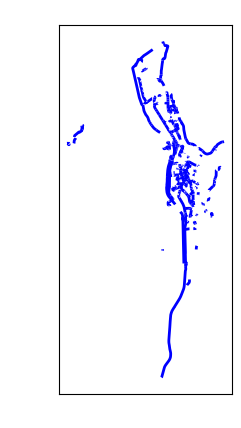

In [ ]:
import geopandas as gpd
import networkx as nx
import osmnx as ox

# Load bike lane data from trento.gpkg
gdf_bike = gpd.read_file("trento.gpkg", layer="lines")
gdf_bike = gdf_bike[gdf_bike.highway.isin(['cycleway'])]

# Convert to a projected CRS for network analysis
gdf_bike = gdf_bike.to_crs(epsg=32632)  # UTM zone 32N (for Trento)

# Plot to check
gdf_bike.plot(color="blue", linewidth=2)


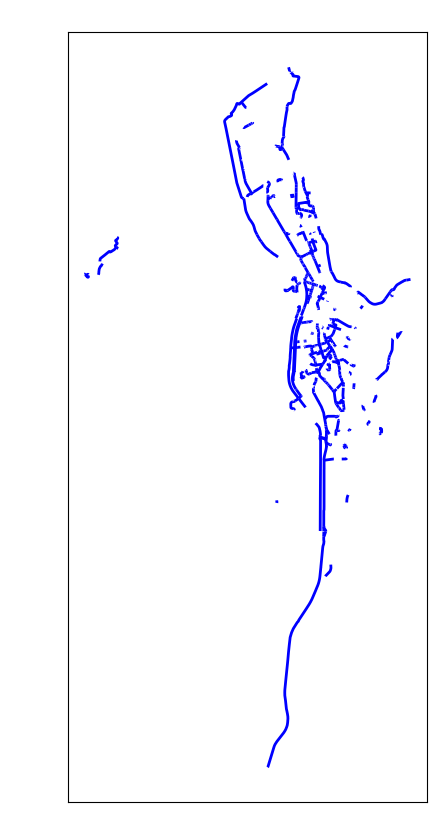

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the "lines" layer (contains roads & bike paths)
gdf = gpd.read_file("trento.gpkg", layer="lines")

# Filter for bike lanes based on OSM tags
gdf_bike = gdf[gdf["highway"].isin(["cycleway"])]
#gdf_bike = gdf_bike[gdf_bike.get("bicycle", "no") != "no"]  # Remove non-bike paths

# Plot bike lanes
fig, ax = plt.subplots(figsize=(10, 10))
gdf_bike.plot(ax=ax, color="blue", linewidth=2)
plt.title("Bike Lanes in Trento (From GPKG)")
plt.show()


In [29]:
# Load Circoscrizioni boundaries
circoscrizioni = gpd.read_file("circoscrizioni.geojson").to_crs(epsg=32632)

# Load Bike Lanes
bike_lanes = gpd.read_file("piste_ciclabili.geojson").to_crs(epsg=32632)

# Load Bike Parking
bike_parking = gpd.read_file("parcheggio_protetto_bike.geojson").to_crs(epsg=32632)
rastrelliere = gpd.read_file("rastrelliere.geojson").to_crs(epsg=32632)

# Load Elevation Data (Isoipse)
elevation = gpd.read_file("isoipsa.geojson", engine="fiona").to_crs(epsg=32632)

In [30]:
# Assign each feature to a circoscrizione
bike_lanes = gpd.sjoin(bike_lanes, circoscrizioni, how="left", predicate="intersects")
bike_parking = gpd.sjoin(bike_parking, circoscrizioni, how="left", predicate="intersects")
rastrelliere = gpd.sjoin(rastrelliere, circoscrizioni, how="left", predicate="intersects")
elevation = gpd.sjoin(elevation, circoscrizioni, how="left", predicate="intersects")

In [32]:
# Download POIs
pois = ox.features_from_polygon(
    polygon,
    tags={"amenity": True, "shop": True, "office": True}  # Get all POIs with these categories
).to_crs(epsg=32632)

In [33]:
# Download Natural Areas
natural_areas = ox.features_from_polygon(
    polygon,
    tags={"leisure": ["park"], "landuse": ["forest", "grass"]}
).to_crs(epsg=32632)

In [34]:
print(natural_areas.geom_type.unique())
print(pois.geom_type.unique())
print(circoscrizioni.geom_type.unique())

['MultiPolygon' 'Polygon']
['Point' 'Polygon' 'LineString']
['Polygon']


In [35]:
pois = pois[pois.geom_type == "Point"]
natural_areas = natural_areas[natural_areas.geom_type == "Polygon"]

In [36]:
# Perform spatial join (assigning circoscrizione to each feature)
pois = gpd.sjoin(pois, circoscrizioni, how="left", predicate="intersects")
natural_areas = gpd.sjoin(natural_areas, circoscrizioni, how="left", predicate="intersects")

In [37]:
bike_lanes

,descrizione,tipologia,tratto isolato ciclabile,tratto isolato ciclopedonale,anno,gestione,itinerario,Tipo CdS,Ordinanza,Monodirezionale,geometry,index_right,numero_circ,area,perimetro,nome,fumetto
0,Pista ciclabile monodirezionale in via Ponte A...,Ciclabile,130.0,NaN,2023.0,None,0,1.3 PCCR marc,None,Mono,"LINESTRING (666266.78 5104413.9, 666275.11 510...",3,6,13199398,20575,ARGENTARIO,Circoscrizione n. 6 - ARGENTARIO
1,Corsia ciclabile per doppio senso ciclabile i...,Corsia ciclabile per doppio senso ciclabile,130.0,NaN,2023.0,None,0,3.5 CCDS 12-ter,None,Mono,"LINESTRING (666280.861 5104502.044, 666278.65 ...",3,6,13199398,20575,ARGENTARIO,Circoscrizione n. 6 - ARGENTARIO
2,Pista ciclabile via del Maso Smalz: tratto tra...,Corsia ciclabile,NaN,NaN,2023.0,None,6,3.4 CC 12-bis,None,Mono,"LINESTRING (663652.777 5102116.055, 663703.443...",4,11,3073349,10962,S.GIUSEPPE-S.CHIARA,Circoscrizione n. 11 - S.GIUSEPPE-S.CHIARA
3,Percorso promiscuo pedonale e ciclabile – Vals...,Ciclopedonale,NaN,NaN,2023.0,PAT,2,2.1 PRO PED,None,None,"LINESTRING (664007.455 5106535.574, 664006.483...",11,12,8599464,23151,CENTRO STORICO PIEDICASTELLO,Circoscrizione n. 12 - CENTRO STORICO PIEDICAS...
4,Strada: Salita Dalla Fior,Strada,NaN,NaN,2023.0,None,2,3.1 PRO CARR,None,None,"LINESTRING (664007.455 5106535.574, 664007.81 ...",11,12,8599464,23151,CENTRO STORICO PIEDICASTELLO,Circoscrizione n. 12 - CENTRO STORICO PIEDICAS...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,Pista ciclabile - via G. Gilli,Ciclabile,NaN,NaN,NaN,None,4,1.3 PCCR marc,None,None,"LINESTRING (663874.518 5106331.954, 663878.616...",11,12,8599464,23151,CENTRO STORICO PIEDICASTELLO,Circoscrizione n. 12 - CENTRO STORICO PIEDICAS...
259,Strada: Via del Brennero,Strada,NaN,NaN,NaN,None,4,3.1 PRO CARR,None,None,"LINESTRING (664086.497 5105087.189, 664070.407...",11,12,8599464,23151,CENTRO STORICO PIEDICASTELLO,Circoscrizione n. 12 - CENTRO STORICO PIEDICAS...
260,Strada: Via L. Caneppele,Strada,NaN,NaN,NaN,None,5,3.1 PRO CARR,None,None,"LINESTRING (662437.008 5107472.425, 662443.067...",10,1,8817959,14719,GARDOLO,Circoscrizione n. 1 - GARDOLO
261,Strada: Località Roncafort,Strada,NaN,NaN,NaN,None,5,3.1 PRO CARR,None,None,"LINESTRING (662287.285 5107695.307, 662294.909...",10,1,8817959,14719,GARDOLO,Circoscrizione n. 1 - GARDOLO


Compute length for bike lanes

In [39]:
# Compute length for bike lanes
bike_lanes["length_m"] = bike_lanes.geometry.length  # Compute length
bike_lanes_length = bike_lanes.groupby("numero_circ")["length_m"].sum().reset_index()

bike_lanes_length

,numero_circ,length_m
0,1,22458.450717
1,2,2254.200691
2,3,934.745790
3,5,13364.064406
4,6,4013.177956
5,7,1524.778269
6,8,10651.971368
7,9,977.718944
8,10,18919.586967
9,11,21390.494528


Bike lane coverage

In [40]:
# Download the street network
streets = ox.graph_from_polygon(polygon, network_type="all")

# Convert to GeoDataFrame
streets = ox.graph_to_gdfs(streets, nodes=False).reset_index()

# Keep only relevant columns
streets = streets[["geometry", "highway"]]

# Reproject to match other layers (EPSG:32632)
streets = streets.to_crs(epsg=32632)

streets = gpd.sjoin(streets, circoscrizioni, how="left", predicate="intersects")

In [41]:
# Compute total street length per circoscrizione
streets["length_m"] = streets.geometry.length  # Compute length
total_street_length = streets.groupby("numero_circ")["length_m"].sum().reset_index()
total_street_length.rename(columns={"length_m": "total_street_length"}, inplace=True)

# Merge with bike lane
coverage_df = total_street_length.merge(bike_lanes_length, on="numero_circ", how="left")

# Compute coverage
coverage_df["bike_lane_coverage"] = coverage_df["length_m"] / coverage_df["total_street_length"]

# Clean up column names
coverage_df = coverage_df[["numero_circ", "bike_lane_coverage"]]

# Show results
coverage_df


,numero_circ,bike_lane_coverage
0,1,0.056651
1,2,0.007086
2,3,0.001624
3,4,NaN
4,5,0.047034
5,6,0.009790
6,7,0.004602
7,8,0.031291
8,9,0.004754
9,10,0.047785


Parking spots and rastrelliere

In [42]:
# Compute number of bike parking spots per circoscrizione
bike_parking_counts = bike_parking.groupby("numero_circ").size().reset_index(name="bike_parking_count")
rastrelliere_counts = rastrelliere.groupby("numero_circ").size().reset_index(name="rastrelliere_count")

# Merge both datasets
bike_parking_df = circoscrizioni[["numero_circ", "geometry"]].copy()
bike_parking_df = bike_parking_df.merge(bike_parking_counts, on="numero_circ", how="left")
bike_parking_df = bike_parking_df.merge(rastrelliere_counts, on="numero_circ", how="left")

# Replace NaN with 0 (for zones with no parking spots)
bike_parking_df[["bike_parking_count", "rastrelliere_count"]] = bike_parking_df[["bike_parking_count", "rastrelliere_count"]].fillna(0)

# Compute area of each circoscrizione (in km²)
bike_parking_df["area_km2"] = bike_parking_df.geometry.area / 1e6

# Compute density (parking spots per km²)
bike_parking_df["bike_parking_density"] = (bike_parking_df["bike_parking_count"] + bike_parking_df["rastrelliere_count"]) / bike_parking_df["area_km2"]

# Keep relevant columns
bike_parking_df = bike_parking_df[["numero_circ", "bike_parking_density"]]

# Display results
bike_parking_df


,numero_circ,bike_parking_density
0,2,0.572804
1,3,0.405958
2,4,0.115432
3,6,0.757610
4,11,41.322993
5,7,0.647980
6,5,0.599241
7,8,0.731835
8,9,0.136299
9,10,6.894468


Natural areas

In [43]:
bike_lanes.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [44]:
buffer_distance = 1000  # in meters
bike_lanes["buffer_geom"] = bike_lanes.geometry.buffer(buffer_distance)


In [45]:
# Create a GeoDataFrame for the bike lane buffers.
# Assign a unique identifier to each bike lane.
bike_lanes = bike_lanes.reset_index().rename(columns={"index": "bike_lane_id"})
buffers = bike_lanes[["bike_lane_id", "numero_circ", "buffer_geom"]].copy()
buffers = buffers.rename(columns={"buffer_geom": "geometry"})
buffers.set_geometry("geometry", inplace=True)
# Compute the area of each buffer (in m²)
buffers["buffer_area_m2"] = buffers.geometry.area

In [46]:
# 1. Compute area (in m²) for each natural area polygon
natural_areas["nat_area_m2"] = natural_areas.geometry.area

# 2. Overlay (clip) natural areas with the bike lane buffers.
buffer_natural = gpd.overlay(natural_areas, buffers, how="intersection")

# 3. For each resulting intersected polygon, compute its area.
buffer_natural["intersect_area"] = buffer_natural.geometry.area

# 4. Sum the intersected natural area per bike lane buffer.
buffer_nat_area = buffer_natural.groupby("bike_lane_id")["intersect_area"].sum().reset_index()

# 5. Merge the summed natural area back into the buffers GeoDataFrame.
#    (Assuming buffers has both bike_lane_id and numero_circ attributes.)
buffer_df = buffers.merge(buffer_nat_area, on="bike_lane_id", how="left")
buffer_df["intersect_area"] = buffer_df["intersect_area"].fillna(0)

# 6. Compute the area of each buffer.
buffer_df["buffer_area_m2"] = buffer_df.geometry.area

# 7. Compute the natural area proportion for each bike lane buffer.
buffer_df["natural_area_prop"] = buffer_df["intersect_area"] / buffer_df["buffer_area_m2"]

# 8. Aggregate by circoscrizione.
#    Note: Summing proportions may exceed 1 if multiple bike lanes exist.
nat_df = buffer_df.groupby("numero_circ")["natural_area_prop"].sum().reset_index()

# Inspect results:
print(nat_df.head())


   numero_circ  natural_area_prop
0            1           1.887819
1            2           0.119178
2            3           1.781930
3            5           6.408834
4            6           2.786698


Points of interest

In [47]:
# (B) POI Density
# Count POIs per circoscrizione
poi_counts = pois.groupby("numero_circ").size().reset_index(name="poi_count")
# Merge with circoscrizioni area (convert to km²)
poi_df = circoscrizioni[["numero_circ", "geometry"]].copy()
poi_df = poi_df.merge(poi_counts, on="numero_circ", how="left")
poi_df["poi_count"] = poi_df["poi_count"].fillna(0)
poi_df["area_km2"] = poi_df.geometry.area / 1e6
poi_df["poi_density"] = poi_df["poi_count"] / poi_df["area_km2"]

In [49]:
pois = pois.reset_index(drop=True)
buffers = buffers.reset_index(drop=True)

In [50]:
# Optionally drop any existing 'index_right' columns if they exist
pois = pois.drop(columns=["index_right"], errors="ignore")
buffers = buffers.drop(columns=["index_right"], errors="ignore")

In [51]:
# Spatial join: assign each POI to a bike lane buffer (using "intersects")
pois_in_buffer = gpd.sjoin(pois, buffers, how="inner", predicate="intersects")

# Count the number of POIs per bike lane buffer (group by bike_lane_id)
poi_counts_buffer = pois_in_buffer.groupby("bike_lane_id").size().reset_index(name="poi_count")

# Merge the POI counts with the buffers GeoDataFrame
buffer_poi_df = buffers.merge(poi_counts_buffer, on="bike_lane_id", how="left")
buffer_poi_df["poi_count"] = buffer_poi_df["poi_count"].fillna(0)

# Compute the area of each buffer in km²
buffer_poi_df["buffer_area_km2"] = buffer_poi_df.geometry.area / 1e6

# Calculate POI density (POIs per km²) for each buffer
buffer_poi_df["poi_density"] = buffer_poi_df["poi_count"] / buffer_poi_df["buffer_area_km2"]

# Now, aggregate these densities by circoscrizione.
# For example, sum the total POI counts and total buffer area per circoscrizione,
# then compute an aggregated density.
agg_df = buffer_poi_df.groupby("numero_circ").agg({
    "poi_count": "sum",
    "buffer_area_km2": "sum"
}).reset_index()
agg_df["poi_density"] = agg_df["poi_count"] / agg_df["buffer_area_km2"]

# Inspect results:
print(agg_df.head())


   numero_circ  poi_count  buffer_area_km2  poi_density
0            1      22495       170.648651   131.820556
1            2        536        10.528871    50.907640
2            3        106        14.181256     7.474656
3            5       5691        54.429272   104.557710
4            6      10089        26.483867   380.948900


Slope

In [52]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Point

def compute_slope_from_isoipse_simple(bike_lane_geom, isoipse, sample_distance=10):
    """
    Compute an approximate slope percentage for a bike lane using isoipse.

    Parameters:
      bike_lane_geom: Shapely LineString geometry for a bike lane.
      isoipse: GeoDataFrame of isoipse that contains an elevation attribute (e.g., "dxf_elevat").
      sample_distance: Distance interval (in meters) at which to sample points along the bike lane.

    Returns:
      slope_percent: Approximate slope percentage.
    """
    # Number of sample points along the bike lane
    num_points = int(np.ceil(bike_lane_geom.length / sample_distance)) + 1
    # Sample points along the bike lane
    sample_points = [bike_lane_geom.interpolate(dist) for dist in np.linspace(0, bike_lane_geom.length, num_points)]

    # Create a GeoDataFrame for the sample points
    samples_gdf = gpd.GeoDataFrame(geometry=sample_points, crs=isoipse.crs)

    # Use sjoin_nearest to assign an elevation to each sample point.
    # Ensure isoipse has the elevation attribute "dxf_elevat"
    joined = gpd.sjoin_nearest(samples_gdf, isoipse[['geometry', 'dxf_elevat']], how="left", distance_col="dist")

    # Extract elevation values from the join
    elev_values = joined["dxf_elevat"].dropna().values
    if len(elev_values) == 0:
        return np.nan  # No elevation data found

    # Calculate elevation difference and slope
    elev_diff = np.max(elev_values) - np.min(elev_values)
    slope_percent = (elev_diff / bike_lane_geom.length) * 100

    return slope_percent

In [53]:
# Compute slope for each bike lane
bike_lanes["slope_percent"] = bike_lanes.geometry.apply(lambda geom: compute_slope_from_isoipse_simple(geom, elevation, sample_distance=10))

# Reset indices and drop potential conflicting columns
bike_lanes = bike_lanes.reset_index(drop=True)
circoscrizioni = circoscrizioni.reset_index(drop=True)
bike_lanes = bike_lanes.drop(columns=["index_right"], errors="ignore")
circoscrizioni = circoscrizioni.drop(columns=["index_right"], errors="ignore")

# Aggregate slope data per circoscrizione
slope_agg = bike_lanes.groupby("numero_circ")["slope_percent"].agg(
    mean_slope="mean",
    median_slope="median",
    min_slope="min",
    max_slope="max",
    std_slope="std"
).reset_index()

slope_agg

,numero_circ,mean_slope,median_slope,min_slope,max_slope,std_slope
0,1,0.587445,0.000000,0.00000,8.231617,1.489265
1,2,7.707233,7.707233,1.37427,14.040195,8.956161
2,3,1.635660,1.373202,0.00000,3.796234,1.936716
3,5,2.106146,0.000000,0.00000,14.234625,4.787219
4,6,6.799603,2.719083,0.00000,31.363167,12.141142
5,7,1.341709,0.000000,0.00000,4.695786,2.081449
6,8,0.060473,0.000000,0.00000,0.181420,0.104743
7,9,2.561306,3.705965,0.00000,4.660129,2.364689
8,10,0.831026,0.000000,0.00000,8.483656,1.968470
9,11,1.214816,0.000000,0.00000,14.961602,2.743408


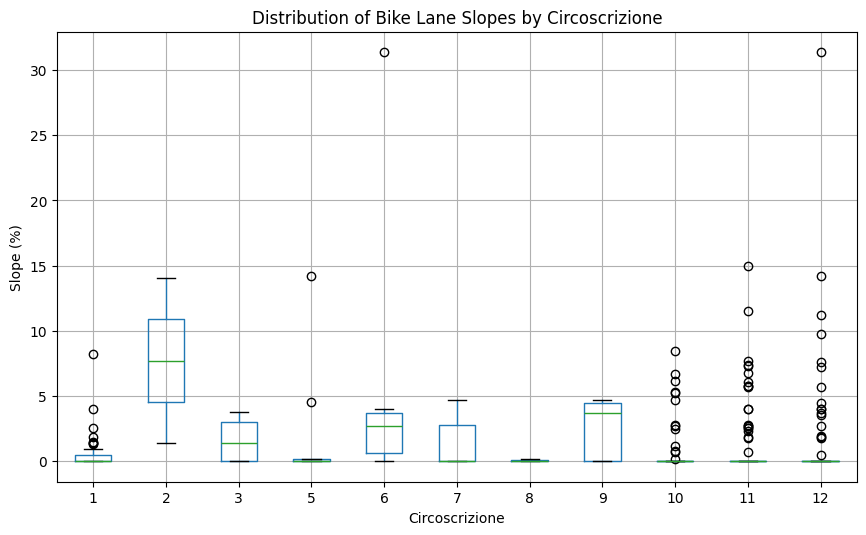

In [ ]:
# Optionally, visualize the distribution with a boxplot:
fig, ax = plt.subplots(figsize=(10, 6))
bike_lanes.boxplot(column="slope_percent", by="numero_circ", ax=ax)
ax.set_title("Distribution of Bike Lane Slopes by Circoscrizione")
ax.set_xlabel("Circoscrizione")
ax.set_ylabel("Slope (%)")
plt.suptitle("")  # Remove the automatic subtitle
plt.show()


Final

In [ ]:
bike_parking_df

,numero_circ,bike_parking_density
0,2,0.572804
1,3,0.405958
2,4,0.115432
3,6,0.757610
4,11,41.322993
5,7,0.647980
6,5,0.599241
7,8,0.731835
8,9,0.136299
9,10,6.894468


In [55]:
# Start with circoscrizioni (key: numero_circ)
final_df = circoscrizioni[["numero_circ", "geometry"]].copy()

# Merge in each indicator
final_df = final_df.merge(bike_lanes_length[["numero_circ", "length_m"]], on="numero_circ", how="left")
final_df = final_df.merge(coverage_df[["numero_circ", "bike_lane_coverage"]], on="numero_circ", how="left")
final_df = final_df.merge(bike_parking_df[["numero_circ", "bike_parking_density"]], on="numero_circ", how="left")
final_df = final_df.merge(nat_df[["numero_circ", "natural_area_prop"]], on="numero_circ", how="left")
final_df = final_df.merge(poi_df[["numero_circ", "poi_density"]], on="numero_circ", how="left")
final_df = final_df.merge(slope_agg[["numero_circ", "mean_slope"]], on="numero_circ", how="left")

In [56]:
final_df

,numero_circ,geometry,length_m,bike_lane_coverage,bike_parking_density,natural_area_prop,poi_density,mean_slope
0,2,"POLYGON ((666651.786 5109264.903, 666650.353 5...",2254.200691,0.007086,0.572804,0.119178,10.055892,7.707233
1,3,"POLYGON ((660741.737 5109007.135, 660757.283 5...",934.745790,0.001624,0.405958,1.781930,8.525124,1.635660
2,4,"POLYGON ((661627.54 5104968.137, 661632.747 51...",NaN,NaN,0.115432,NaN,11.543162,NaN
3,6,"POLYGON ((667907.213 5105334.453, 667905.638 5...",4013.177956,0.009790,0.757610,2.786698,16.137100,6.799603
4,11,"POLYGON ((663312.544 5102745.129, 663330.224 5...",21390.494528,0.085160,41.322993,34.360950,436.982518,1.214816
5,7,"POLYGON ((669072.179 5099653.356, 668637.088 5...",1524.778269,0.004602,0.647980,3.752946,14.968340,1.341709
6,5,"POLYGON ((663871.728 5094972.066, 663852.148 5...",13364.064406,0.047034,0.599241,6.408834,11.205805,2.106146
7,8,"POLYGON ((663871.728 5094972.066, 663875.878 5...",10651.971368,0.031291,0.731835,0.607427,16.893184,0.060473
8,9,"POLYGON ((666987.471 5098181.576, 666974.784 5...",977.718944,0.004754,0.136299,1.568996,17.855130,2.561306
9,10,"POLYGON ((663813.095 5101039.248, 663813.095 5...",18919.586967,0.047785,6.894468,21.481826,117.636860,0.831026


In [ ]:
for col in ["bike_lane_coverage", "bike_parking_density", "natural_area_prop", "poi_density", "avg_slope"]:
    final_df[col] = final_df[col].fillna(0)

In [ ]:
def normalize_series(series, invert=False):
    """Min-max normalize a pandas Series; invert if lower values are better."""
    norm = (series - series.min()) / (series.max() - series.min())
    if invert:
        norm = 1 - norm
    return norm

In [ ]:
# For these indicators, assume higher values mean better bikeability:
# - bike_lane_coverage, sidewalk_coverage, bike_parking_density, natural_area_prop, poi_density.
# For slope, lower values are better so we invert it.
final_df["bike_lane_coverage_norm"] = normalize_series(final_df["bike_lane_coverage"])
final_df["sidewalk_coverage_norm"] = normalize_series(final_df["sidewalk_coverage"])
final_df["bike_parking_density_norm"] = normalize_series(final_df["bike_parking_density"])
final_df["natural_area_prop_norm"] = normalize_series(final_df["natural_area_prop"])
final_df["poi_density_norm"] = normalize_series(final_df["poi_density"])
final_df["avg_slope_norm"] = normalize_series(final_df["avg_slope"], invert=True)

In [ ]:
final_df["bikeability_index"] = (
    final_df["bike_lane_coverage_norm"] +
    final_df["sidewalk_coverage_norm"] +
    final_df["bike_parking_density_norm"] +
    final_df["natural_area_prop_norm"] +
    final_df["poi_density_norm"] +
    final_df["avg_slope_norm"]
) / 6

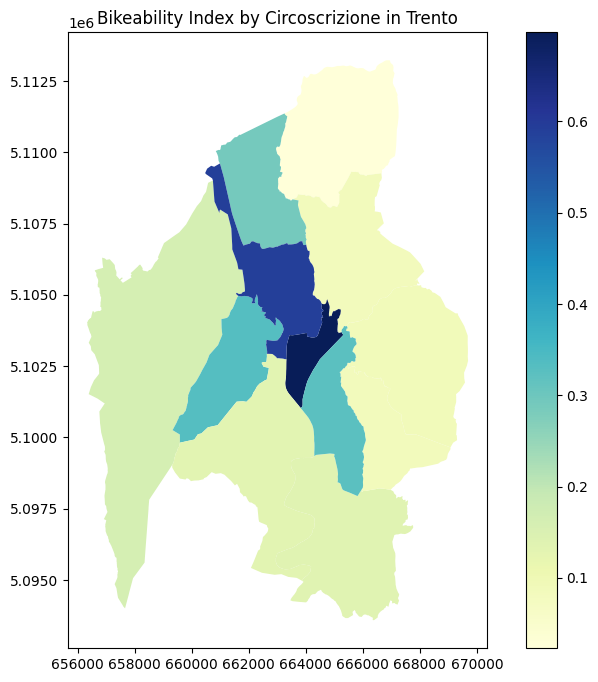

In [ ]:
# Simple choropleth map using GeoPandas
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
final_df.plot(column="bikeability_index", cmap="YlGnBu", legend=True, ax=ax)
ax.set_title("Bikeability Index by Circoscrizione in Trento")
plt.show()


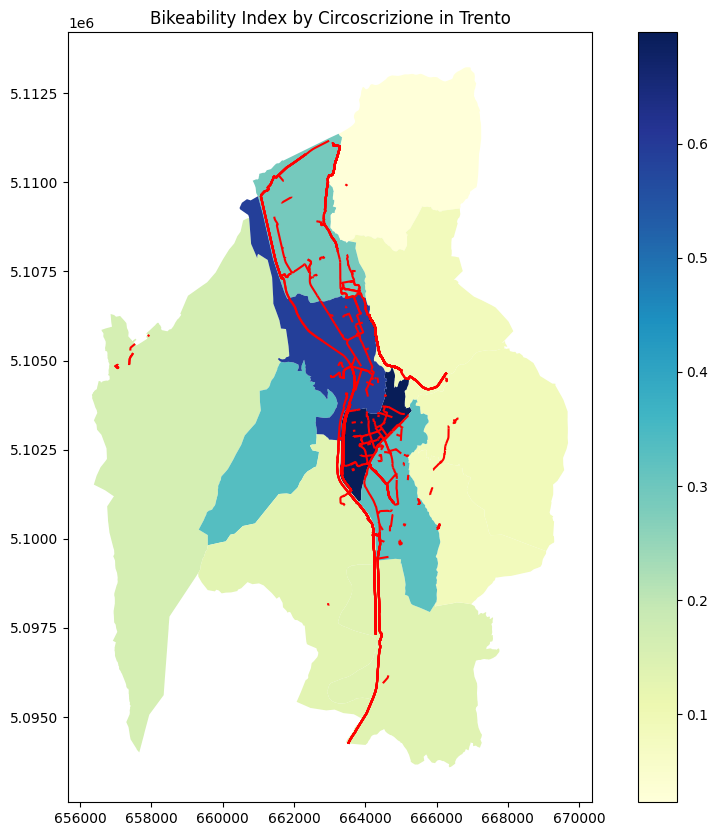

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Plot the final choropleth map (bikeability index)
final_df.plot(column="bikeability_index", cmap="YlGnBu", legend=True, ax=ax)
ax.set_title("Bikeability Index by Circoscrizione in Trento")

# Overlay the bike lanes
bike_lanes.plot(ax=ax, color="red", linewidth=1.5)

plt.show()


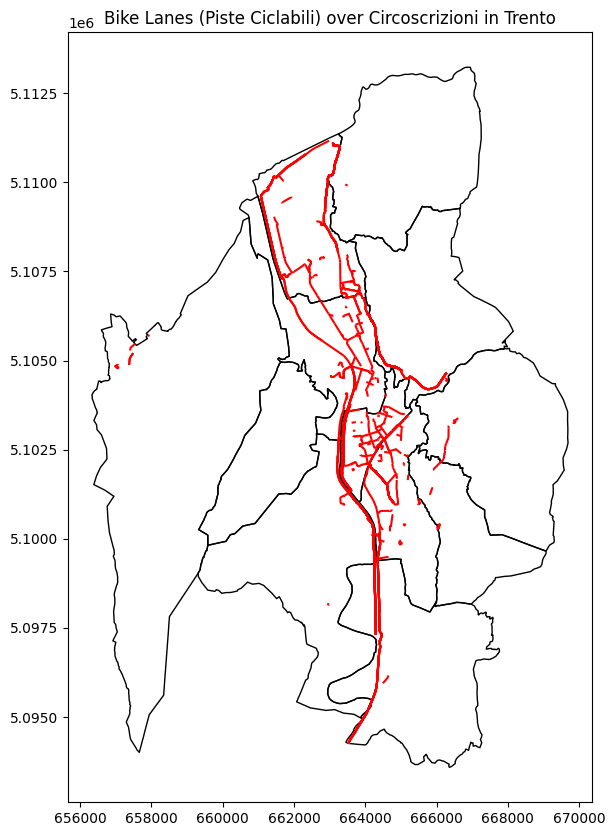

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,10))

# Plot circoscrizioni boundaries
circoscrizioni.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=1)

# Overlay the bike lanes in red
bike_lanes.plot(ax=ax, color="red", linewidth=1.5)

ax.set_title("Bike Lanes (Piste Ciclabili) over Circoscrizioni in Trento")
plt.show()


In [ ]:
# ------------------------------
# 1. AGGREGATE INDICATORS BY CIRCOSCRIZIONE
# ------------------------------







# (D) Coverage Indicators
# We already computed bike lane and sidewalk coverage in 'coverage_df'
# It contains: numero_circ, bike_lane_coverage, sidewalk_coverage

# (E) Bike Parking Density is in bike_parking_df (we computed it earlier)
# It has: numero_circ, bike_parking_density

# (F) Total Street Length is used in coverage_df but we only need the ratios there.

# ------------------------------
# 2. MERGE INDICATORS INTO A SINGLE DATAFRAME
# ------------------------------



# Fill missing values with 0 for indicators where appropriate


# ------------------------------
# 3. NORMALIZE INDICATORS
# ------------------------------





# ------------------------------
# 4. COMPUTE FINAL BIKEABILITY INDEX
# ------------------------------

# For a simple average index, assign equal weight to each indicator:


# ------------------------------
# 5. EXPORT AND VISUALIZE RESULTS
# ------------------------------

# Export to CSV (geometry can be dropped if not needed)
final_df.drop(columns="geometry").to_csv("bikeability_index_trento.csv", index=False)

